# HW3 Lab

\textbf{Lab:} In a previous lab you learned to blur an image, represented as an
$m\times n$ pixel intensity matrix $\bold{X}$, through multiplying by a
matrix on each side. Let $\bold{V}=\bold{B}_m$ and $\bold{H}=\bold{B}_n^T$, where each
$\bold{B}_p$ is a $p\times p$ local blurring matrix returned by your function
``blurmatrix``. For some positive integer $k$, 
\begin{equation}
  \bold{Z}=\bold{V}^k \bold{X} \, \bold{H}^k
\end{equation}
applies local blurring $k$ times in each direction to get the
resulting $\bold{Z}$. 

It's much more common, of course, to have a blurred image that you
want to restore, or \textit{deblur}. We can easily express the process
using matrix inverses: 
$$
\bold{X} = \bold{V}^{-k} \bold{Z} \, \bold{H}^{-k}.
$$
However, in computational practice we rarely use matrix inverses;
instead, we solve linear systems. In Julia this is done by using
\verb+\+ (backslash) when multiplying by an inverse on the left (use $\mathbf{A} \verb+\+ \mathbf{b}$ to solve $\mathbf{A} \mathbf{x} = \mathbf{b}$), and
\verb+/+ (forward slash) when multiplying by an inverse on the right (use $\mathbf{b} \verb+/+ \mathbf{A}$ to solve $\mathbf{x}^\top \mathbf{A} = \mathbf{b}^\top$).

It's intuitively clear that blurring and deblurring are fundamentally different. While we can blur an image as much as we like, we expect that a severely blurred image cannot be accurately restored. In finite precision, this proves to be the case. This week we are learning how to characterize matrix multiplications like this that cannot easily be undone. 

Goals: You will blur an image as before, then apply backslash and slash to
deblur it. For a small amount of blur this will succeed, but not when you try to restore a more severely blurred image.  

Procedure: Perform the following steps. Make sure your function `blurmatrix` is available. 

In [1]:
using LinearAlgebra, Plots, Images

In [2]:
function blurmatrix(n)
    return diagm(0 => ones(n)/2, 1 => ones(n-1)/4, -1 => ones(n-1)/4)
end

blurmatrix (generic function with 1 method)

### (a)

Using `blurmatrix`, let $\bold{V}=\bold{B}_{100}$. Make side-by-side plots of $\bold{V}$ and $\bold{V}^{-1}$ using `spy` (see Lecture 6). Note that while the nonzeros of $\bold{V}$ are all near the diagonal, the same is not true for $\bold{V}^{-1}$, so deblurring is not a simple local operation. 

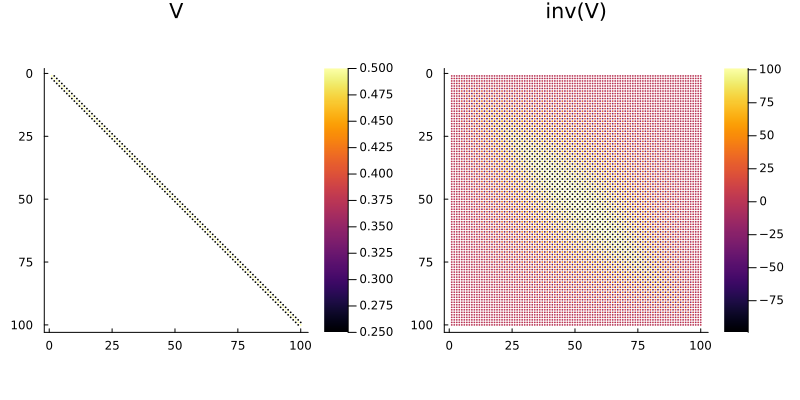

In [3]:
V = blurmatrix(100)

# plot V and its inverse side by side using spy
plot(layout=2, size=(800, 400))
spy!(V, subplot=1, title="V")
spy!(inv(V), subplot=2, title="inv(V)")


### (b)

Download and locally save an image. For best results, use a cartoon or line drawing of size 500 pixels or less on each side. Import the image and call the result $\bold{X}$, the original image.

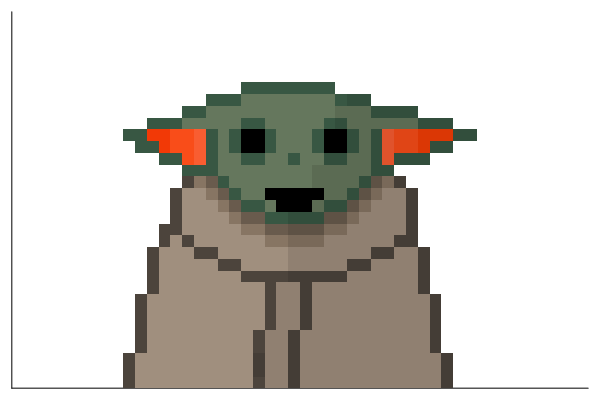

In [4]:
# load image and convert
X = load("hw3_image.png") # substitute with your image

# show image
plot(size=(400, 400))
heatmap(X, c=:grays, axis=nothing, yflip=true)

### (c)

Make side-by-side plots of $(V^{-1})^6$ and $(V^6)^{-1}$. These should be equivalent, but your results will not be---our first sign of some trouble.

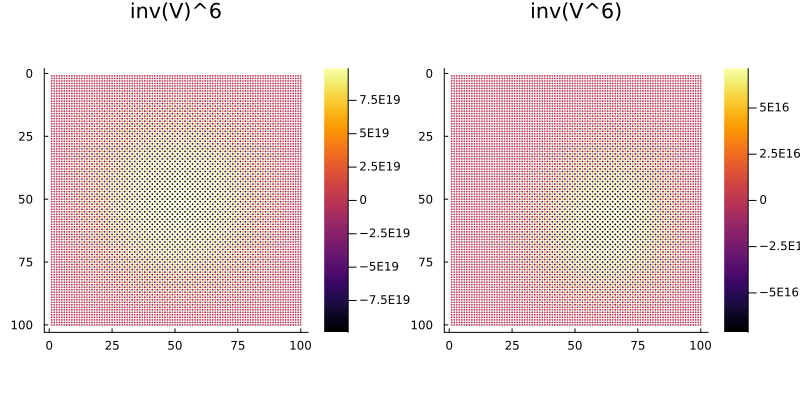

In [5]:
# Plots
plot(layout=2, size=(800, 400))
spy!(inv(V)^6, subplot=1, title="inv(V)^6")
spy!(inv(V^6), subplot=2, title="inv(V^6)")

The two results are indeed different!

### (d)

Using $k=1$, let $\bold{Z}$ be the blurred image as described in equation (1) . Using `subplot` and `heatmap`, make side by side pictures of the original and blurred images.

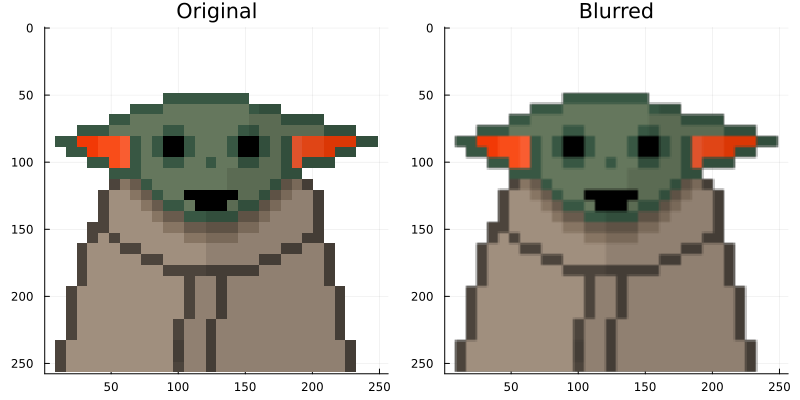

In [6]:
# Blur the image once
Bm = blurmatrix(size(X, 1))
Bn = blurmatrix(size(X, 2))
Z = Bm * X * Bn'

# show image and its blurred version
plot(layout=2, size=(800, 400))
heatmap!(X, c=:grays, yflip=true, subplot=1, title="Original")
heatmap!(Z, c=:grays, yflip=true, subplot=2, title="Blurred")

### (e)

Now let $\bold{Y}$ be the result of deblurring $\bold{Z}$. Use \ and /, as described in the introduction. Make side by side pictures of $\bold{X}$ and $\bold{Y}$. You should see apparently identical images.

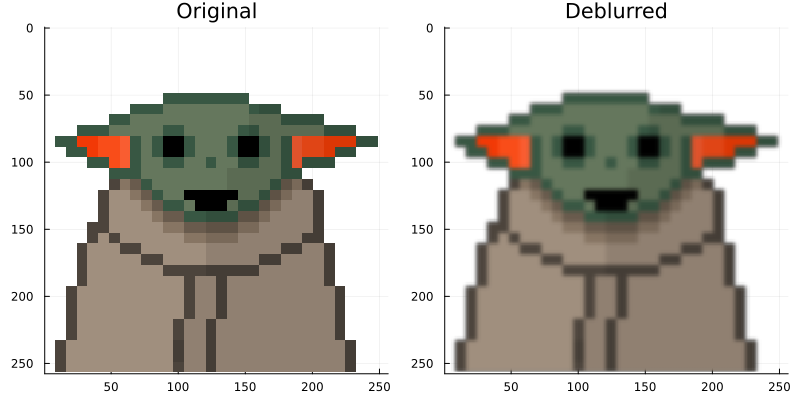

In [ ]:
# deblur the image
Y = Bm \ Z / Bn'

# show image vs. deblurred image
plot(layout=2, size=(800, 400))
heatmap!(X, c=:grays, yflip=true, subplot=1, title="Original")
heatmap!(Y, c=:grays, yflip=true, subplot=2, title="Deblurred")

### (f)

Repeat steps 4 and 5, but using $k=6$. The restoration results should be very different!

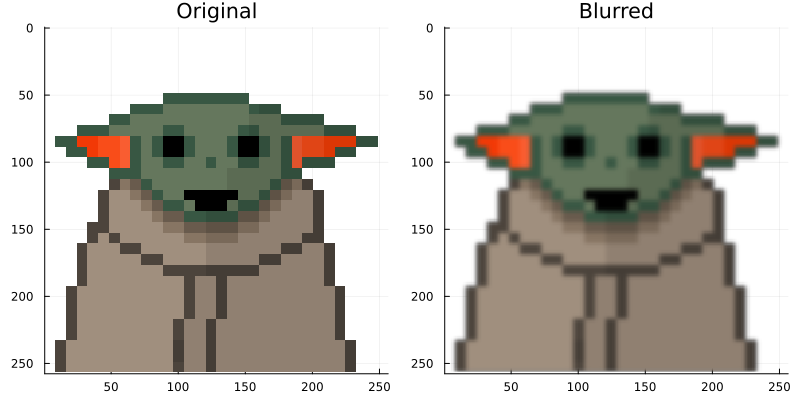

In [13]:
# Blur the image once
Bm = blurmatrix(size(X, 1))
Bn = blurmatrix(size(X, 2))
Z = Bm^6 * X * Bn'^6

# show image and its blurred version
plot(layout=2, size=(800, 400))
heatmap!(X, c=:grays, yflip=true, subplot=1, title="Original")
heatmap!(Z, c=:grays, yflip=true, subplot=2, title="Blurred")

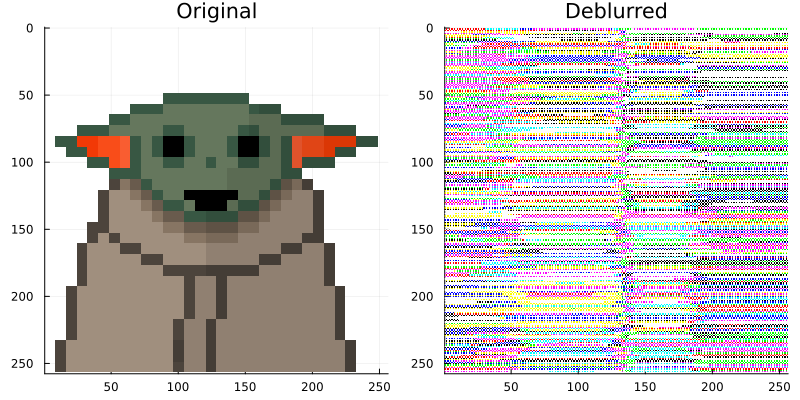

In [ ]:
# deblur the image
Y = Bm^6 \ Z / Bn'^6

# show image vs. deblurred image
plot(layout=2, size=(800, 400))
heatmap!(X, c=:grays, yflip=true, subplot=1, title="Original")
heatmap!(Y, c=:grays, yflip=true, subplot=2, title="Deblurred")

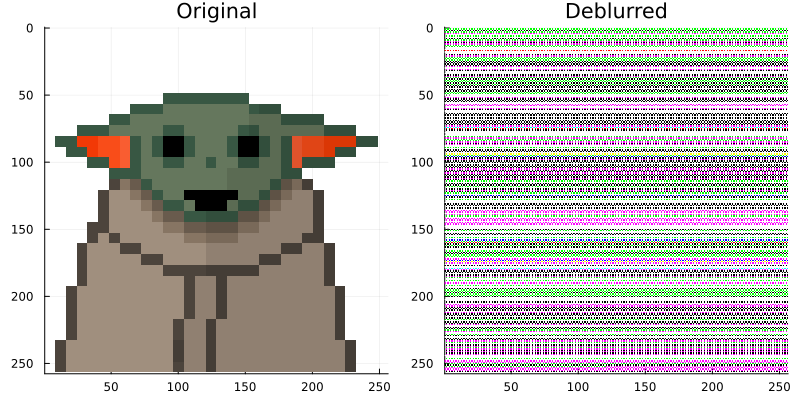

In [15]:
# other way to do it
Y = inv(Bm)^6 * Z * inv(Bn')^6

# show image vs. deblurred image
plot(layout=2, size=(800, 400))
heatmap!(X, c=:grays, yflip=true, subplot=1, title="Original")
heatmap!(Y, c=:grays, yflip=true, subplot=2, title="Deblurred")

Oops!